# `Практикум по программированию на языке Python`

## `Задание 02. Сегментация изображений`

#### Фамилия, имя: 

Дата выдачи: <span style="color:red">__18 марта 17:00__</span>.

Мягкий дедлайн: <span style="color:red">__01 апреля 23:59__</span>.

Стоимость: __10 баллов__ (основная часть заданий) + __4.25 балла__ (дополнительные задания).

<span style="color:red">__В ноутбуке все клетки должны выполняться без ошибок при последовательном их выполнении.__</span>

#### `Москва, 2023`

В этом задании вы будете решать задачу сегментации людей на фотографии с помощью нейросетевых архитектур `U-Net` и `LinkNet`. 

Данные для выполнения задания можно скачать по [ссылке](https://disk.yandex.ru/d/tI6d3LBMHTwOnw).


## `Загрузка данных (1 балл)`

Для загрузки данных pytorch опирается на такую сущность, как **`Dataset`**.

Этот абстрактный класс определен в `torch.utils.data.dataset`:

```python
class Dataset(object):
    """An abstract class representing a Dataset.

    All other datasets should subclass it. All subclasses should override
    ``__len__``, that provides the size of the dataset, and ``__getitem__``,
    supporting integer indexing in range from 0 to len(self) exclusive.
    """

    def __getitem__(self, index):
        raise NotImplementedError

    def __len__(self):
        raise NotImplementedError

    def __add__(self, other):
        return ConcatDataset([self, other])
```
При определении нового источника данных мы создаем наследника данного класса и реализуем методы `__getitem__` и `__len__`.

Пример готового такого класса — `torchvision.datasets.ImageFolder`, который позволяет создать датасет на основе директории с ImageNet-подобной структурой поддиректорий (`./train/{class}` и `./val/{class}`):

```python
imagenet = torchvision.datasets.ImageFolder('path/to/imagenet_root/')
```

Реализуйте класс `PhotosDataset` для выданных данных.

**Внимание.** Возможно, стоит прочитать следующий пункт задания, чтобы реализация была удобной.

In [1]:
import os

import numpy as np
import numpy.testing as npt

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision.models import vgg13, VGG13_Weights
from torchvision.transforms import Compose
from torchvision import transforms
from tqdm.notebook import tqdm

import matplotlib_inline
import matplotlib.pyplot as plt

#для изображений
from PIL import Image
from PIL import ImageEnhance

%matplotlib inline
matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')

In [ ]:
class PhotosDataset(Dataset):
    def __init__(self, images_dir, target_dir=None, transforms=None):
        """
        Arguments
        ---------
        images_dir : str
            Path to directory with images
            
        target_dir : str
            Path to directory with masks.
            Each mask corresponds to one image.
            Corresponding mask and image have the same name, but different format.
            
        transforms : some collection
            Sequence of transformations for images and masks. 
        """
        self.image_paths = sorted([os.path.join(images_dir, fname) for fname in os.listdir(images_dir)])
        if target_dir is not None:
            self.target_paths = sorted([os.path.join(target_dir, tname) for tname in os.listdir(target_dir)])
        else:
            self.target_paths = []
        if transforms is not None:
            self.transforms = Compose(transforms)
        else:
            self.transforms = Compose([])
        
    def __len__(self):
        return len(self.image_paths) 

    def __getitem__(self, idx):
        """
        Arguments
        ---------
        idx : int
            Index of image and mask
        
        Returns
        -------
        (image, mask)
        """
        image = Image.open(self.image_paths[idx])
        if self.target_paths:
            target = Image.open(self.target_paths[idx])
            return self.transforms((image, target))
        else:
            return self.transforms(image), None

        

## `Модуль аугментации (2 балла)`

Конструктор стандартного `ImageFolder`, принимает параметр `transform` (и иногда `target_transform`).

Они служат для того, чтобы загружаемые изображения (обычно это `PIL.Image`) или таргеты преобразовывать в тензоры нужного вида.

В `torchvision` входит модуль `transforms` для стандартных примеров таких преобразований. В `transforms` могут содержаться случайные преобразования, это самый простой путь для реализации аугментации данных.

При определении кастомного трансформера помимо конструктора нужно реализовать лишь метод `__call__`:

```python
class HorizontalFlip(object):
    def __init__(self, mode=0):
        self.method = mode

    def __call__(self, img):
        """
        Args:
            img (PIL.Image): Image to be flipped.

        Returns:
            PIL.Image: Randomly flipped image.
        """
        if self.method:
            return img.transpose(Image.FLIP_LEFT_RIGHT)
        return img

```

С полным списком стандартных преобразований можно ознакомиться в [документации](https://pytorch.org/vision/0.12/transforms.html).

В данной части вам предлагается самостоятельно реализовать несколько кастомных трансформеров.
Обратите внимание, что для некоторых трансформеров, необходимо преобразовывать и изображение, и маску, а для каких-то только изображение.

Один из путей реализации:
* реализовать декоратор, делающий любое преобразование случайным
* реализовать декоратор, применяющий преобразование и к изображению, и к маске

Список трансформеров, которые надо реализовать:

* случайное (с вероятностью $p$) горизонтальное отображение (flip) изображения 
* случайное (с вероятностью $p$) вырезание фрагмента изображения (заданного или случайного размера)
* случайное (с вероятностью $p$) изменение яркости изображения (на заданную или случайную величину)
* случайное (с вероятностью $p$) изменение фона изображения (на изображение из заданного списка изображений)

In [ ]:
class HorizontalFlip(object):
    def __init__(self, p=0.5):
        self.p = p

    def __call__(self, img):
        if torch.rand(1) < self.p:
            return (
                img[0].transpose(Image.FLIP_LEFT_RIGHT),
                img[1].transpose(Image.FLIP_LEFT_RIGHT)
            )

        return img

In [ ]:
class Crop(object):

    def __init__(self, p=0.5,  size=None):
        '''
            if size=None -> random size
            size = (height x width)
        '''
        self.size = size
        self.p = p

    def get_params_(self, img, output_size):
        '''
            returns coordinates of left upper point and new size
        '''
        w, h = img.size
        if output_size is None:
            new_w = torch.randint(1, w, (1,)).item()
            new_h = torch.randint(1, h, (1,)).item()
        else:
            new_h, new_w = output_size
        if new_h > h or new_w > w:
            raise ValueError(f'Required crop size {(new_h, new_w)} is larger then input image size {(h, w)}')
        if w == new_w and h == new_h:
            return 0, 0, h, w
        
        j = torch.randint(0, h - new_h + 1, size=(1,)).item()
        i = torch.randint(0, w - new_w + 1, size=(1,)).item()
        return i, j, new_h, new_w

    def __call__(self, img):
        if torch.rand(1) < self.p:
            i, j, h, w = self.get_params_(img[0], self.size)
            prev_size = img[0].size
            return (
                img[0].crop((i, j, i + w, j + h)).resize(prev_size),
                img[1].crop((i, j, i + w, j + h)).resize(prev_size)
            )
        return img
    
    

In [ ]:
class Brightness(object):

    def __init__(self, p=0.5, bright=1.0):
        self.p = p
        self.bright = bright

    def get_factor_(self, bright):
        factor = 1.0 + bright
        if bright is None:
            left_br = 0.2
            right_br = 2.2
            factor = (right_br - left_br) * torch.rand(1) + left_br
        return factor

    def __call__(self, img):
        enhancer = ImageEnhance.Brightness(img[0])
        if torch.rand(1) < self.p:
            factor = self.get_factor_(self.bright)
            return (enhancer.enhance(factor), img[1])
        return img

In [ ]:
class Background(object):

    def __init__(self, p=0.5, background_list=None):
        self.p = p
        self.background_list = background_list
    
    def __call__(self, img):
        if torch.rand(1) < self.p and self.background_list is not None:
            idx = torch.randint(0, len(self.background_list), (1,)).item()
            backgr = Image.open(self.background_list[idx])
            return (
                Image.composite(img[0], backgr, img[1]),
                img[1]
            )
        return img


Добавьте случайные преобразования в ваши датасеты. Также, добавьте преобразование в tensor и нормализацию для изображения:

```python
transforms.ToTensor()
transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225]
)
```

In [ ]:
class ToTensor(object):
    def __init__(self):
        self.to_tensor = transforms.ToTensor()

    def __call__(self, img):
        return (
            self.to_tensor(img[0]),
            self.to_tensor(img[1])
        )

class Normalize(object):
    def __init__(self, mean, std):
        self.normalize = transforms.Normalize(mean, std)
    
    def __call__(self, img):
        return (
            self.normalize(img[0]),
            img[1]
        )

In [ ]:
DATA_PATH = os.path.join(".", "Data", "people_data")

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        HorizontalFlip(0),
        #Crop(p=0, size=(100, 240)),
        Brightness(p=0),
        Background(p=0),
        ToTensor(),
        Normalize(mean=mean, std=std)

    ]
)

test_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'test'),
    target_dir=os.path.join(DATA_PATH, 'test_mask'),
    transforms=[
        ToTensor(),
        Normalize(mean=mean, std=std)
    ]
)

Функция для отображения изображения:

In [ ]:
def show_idx_image(dataset, idx):
    image, mask = dataset[idx]

    image = image.permute(1, 2, 0).numpy()
    image = (image * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
    image = np.clip(image, 0, 1)

    mask = mask.squeeze(0).numpy()

    fig, axes = plt.subplots(1, 2, figsize=(6, 4))

    axes[0].imshow(image)
    axes[1].imshow(mask)
    
    axes[0].set_axis_off()
    axes[1].set_axis_off()
    
    fig.tight_layout()
    plt.show()

Отобразите несколько изображений и масок, на которых будет видна правильная работа вашего модуля аугментации данных.

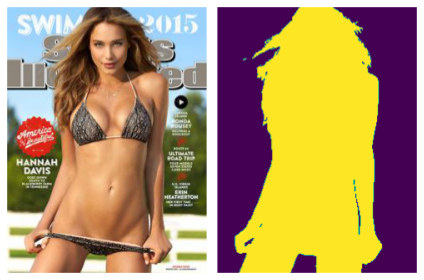

In [ ]:
img = 1342
show_idx_image(train_dataset, img)

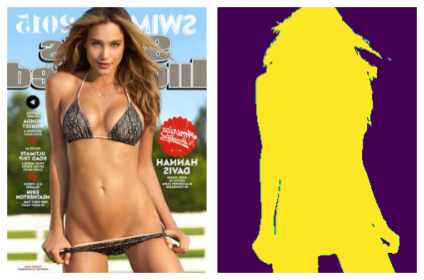

In [ ]:
train_dataset.transforms = Compose([
        HorizontalFlip(1),
        Crop(p=0, size=(100, 240)),
        Brightness(p=0),
        Background(p=0),
        ToTensor(),
        Normalize(mean=mean, std=std)

    ])

show_idx_image(train_dataset, img)

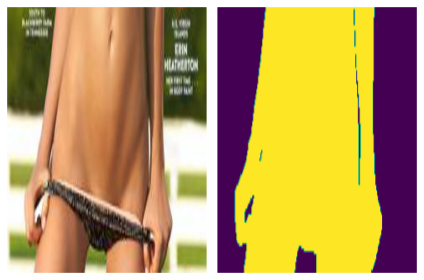

In [ ]:
train_dataset.transforms = Compose([
        HorizontalFlip(0),
        Crop(p=1, size=(100, 240)),
        Brightness(p=0),
        Background(p=0),
        ToTensor(),
        Normalize(mean=mean, std=std)

    ])

show_idx_image(train_dataset, img)

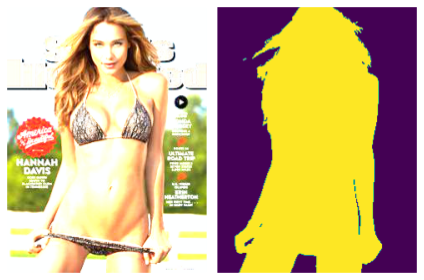

In [ ]:
train_dataset.transforms = Compose([
        HorizontalFlip(0),
        Crop(p=0, size=(100, 240)),
        Brightness(p=1),
        Background(p=0),
        ToTensor(),
        Normalize(mean=mean, std=std)

    ])

show_idx_image(train_dataset, img)

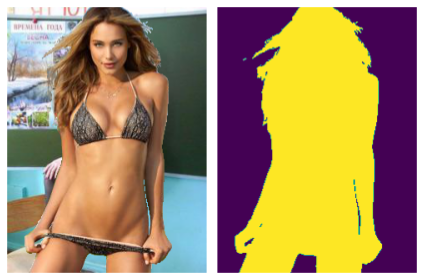

In [ ]:
train_dataset.transforms = Compose([
        HorizontalFlip(0),
        Crop(p=0, size=(100, 240)),
        Brightness(p=0),
        Background(p=1),
        ToTensor(),
        Normalize(mean=mean, std=std)

    ])

train_dataset.transforms.transforms[3].background_list = train_dataset.image_paths
show_idx_image(train_dataset, img)

## `Загрузчики`

При обучении сети удобнее работать не с датасетами, а с загрузчиками. Загрузчики создаются на основе датасета и позволяют итерироваться по батчам из него.

Обратите внимание на параметры `DataLoader`. При `num_workers`$\;> 1$, батчи готовятся (загружаются картинки, обрабатываются и так далее) сразу в нескольких фоновых процессах. С помощью параметра `shuffle` можно подавать картинки на обучение в случайном порядке.

Обычно, скорость обработки данных на GPU превышает скорость загрузки данных в одном процессе, поэтому типичное значение для `num_workers`$\approx 3\text{-}10$. 

Учтите, что на некоторых системах в Jupyter Notebook при `num_workers`$>0$ `DataLoader` перестаёт работать. В таком случае установите это значение в $0$.

In [ ]:
test_data_loader = DataLoader(test_dataset, batch_size=8, num_workers=0)
train_data_loader = DataLoader(train_dataset, batch_size=8, num_workers=0, shuffle=True)

## `DiceLoss (1 балл)`

Функция потерь реализовывается как и все стандартные нейронные модули в pytorch, через `torch.nn.Module`. В ячейке ниже вам предлагается реализовать функцию потерь `dice` (аналог меры Жаккарда).

Результат **Dice Loss** определим как:

$$
\text{Dice Coefficient} = 2\frac{|A \cap B| }{|A| + |B|} \leadsto \text{Dice Loss} = 1 - \frac{2\sum\limits_{i, j}a_{ij}b_{ij}}{\sum\limits_{ij}(a_{ij} + b_{ij} + \varepsilon)}
$$

где $a_{ij} \in [0, 1]$ — предсказанная вероятность нахождения человека в пикселе изображения, $b_{ij}$ — истинная разметка для пикселя изображения.

In [ ]:
class DiceLoss(torch.nn.Module):
    def __init__(self, eps=1e-7, reduction=None, with_logits=True):
        """
        Arguments
        ---------
        eps : float
            eps in denominator
        reduction : Optional[str] (None, 'mean' or 'sum')
            specifies the reduction to apply to the output:
            
            None: no reduction will be applied
            'mean': the sum of the output will be divided by the number of elements in the batch
            'sum':  the output will be summed. 
        with_logits : bool
            If True, use additional sigmoid for inputs
        """
        super().__init__()
        self.eps = eps
        self.reduction = reduction
        self.with_logits = with_logits
        
    def forward(self, logits, true_labels):
        """
        Arguments
        ---------
        logits: torch.Tensor
            Unnormalized probability of true class. Shape: [B, ...]
        true_labels: torch.Tensor
            Mask of correct predictions. Shape: [B, ...]
        Returns
        -------
        torch.Tensor
            If reduction is 'mean' or 'sum' returns a tensor with a single element
            Otherwise, returns a tensor of shape [B]
        """
        true_labels = true_labels.to(torch.long)
        
        if self.with_logits:
            logits = torch.sigmoid(logits)
        
        logits = logits.squeeze(1)
        true_labels = true_labels.squeeze(1)
        loss = (1 - 2 * (torch.sum(logits * true_labels, (1, 2))) /
                torch.sum(logits + true_labels + self.eps, (1, 2)))
        
        if self.reduction == 'sum':
            loss_value = torch.sum(loss)
        elif self.reduction == 'mean':
            loss_value = torch.mean(loss)
        elif self.reduction is None:
            loss_value = loss
            
        return loss_value

Проверка реализации:

In [ ]:
logits = torch.tensor([
    [[0, 0.5], [0.5, 1]],
    [[0.1, 0.1], [0, 0]],
])

target = torch.tensor([
    [[0, 1], [1, 1]],
    [[1, 0], [0, 1]],
])

losses = DiceLoss(with_logits=False, reduction=None, eps=1e-7)(logits, target)
npt.assert_almost_equal(losses.numpy(), np.array([0.2, 0.90909]), decimal=4)

loss = DiceLoss(with_logits=False, reduction='mean', eps=1e-7)(logits, target)
npt.assert_almost_equal(float(loss.numpy()), 0.554545, decimal=4)

loss = DiceLoss(with_logits=False, reduction='sum', eps=1e-7)(logits, target)
npt.assert_almost_equal(float(loss.numpy()), 1.10909, decimal=4)

## `U-Net (3 балла)`

Для решения задачи сегментации будем использовать [U-Net](https://arxiv.org/pdf/1505.04597.pdf) с энкодером из первых блоков предобученного `VGG13`.

Концептуальная схема представлена на диаграмме ниже:

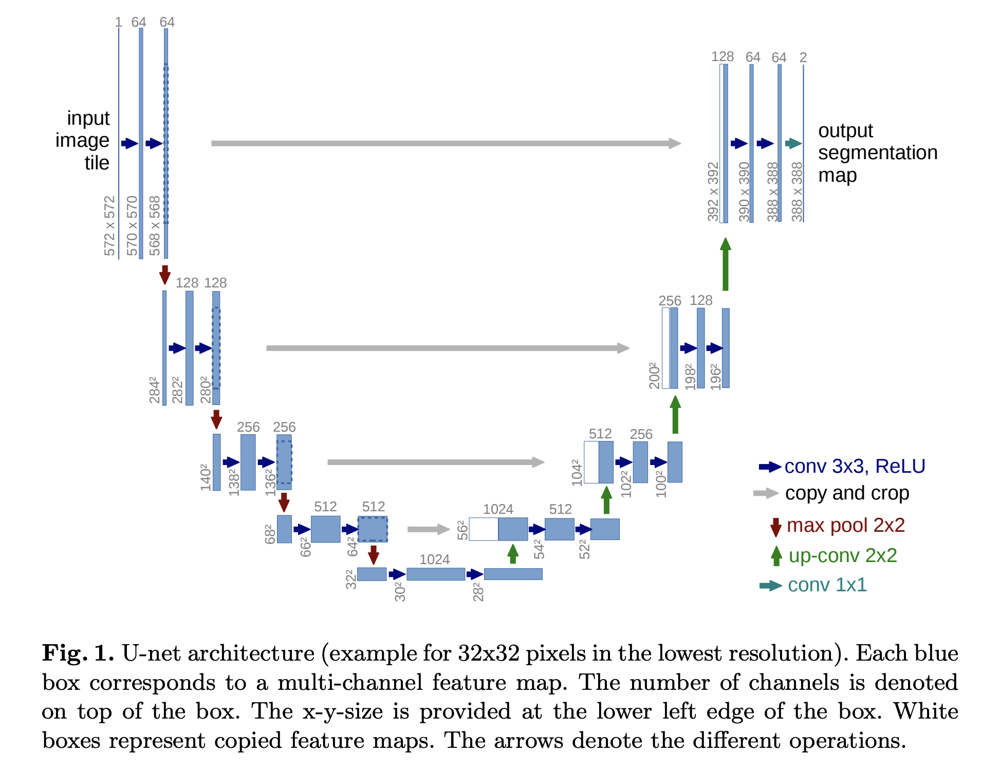

Заметим, что блоки VGG13 имеют следующий вид:
```python
    (0): Conv2d(...)
    (1): ReLU(...)
    (2): Conv2d(...)
    (3): ReLU(...)
    (4): MaxPool2d(...)
```

Для удобства, уберём слои `MaxPool2d` из блоков энкодера и будем применять pooling отдельно.

Реализуйте архитектуру данной сети.

In [ ]:
type(vgg13(weights=VGG13_Weights.DEFAULT).features[4])

torch.nn.modules.pooling.MaxPool2d

#### `Encoder`

In [ ]:
class VGG13Encoder(torch.nn.Module):
    def __init__(self, num_blocks, weights=VGG13_Weights.DEFAULT):
        super().__init__()
        self.num_blocks = num_blocks
        
        # Будем использовать предобученную VGG13 в качестве backbone
        feature_extractor = vgg13(weights=weights).features
        
        # Каждый блок энкодера U-Net — это блок VGG13 без MaxPool2d
        self.blocks = torch.nn.ModuleList()
        for idx in range(self.num_blocks):
            # Возьмите нужные слои из `feature_extractor` для очередного U-Net блока
            # Объедините их с помощью `torch.nn.Sequential`
            self.blocks.append(
                torch.nn.Sequential(*[
                        feature_extractor[j] for j in range(5 * idx, 5 * idx + 4)]
                )
            )

    def forward(self, x):
        activations = []
        for idx, block in enumerate(self.blocks):
            # Примените очередной блок U-Net
            # your code here
            x = block(x)

            # Сохраните активации для передачи их в декодер
            # your code here
            activations.append(x)

            # При необходимости примените max-pool
            # Можно использовать `torch.functional.F.max_pool2d`
            # your code here
            if idx != self.num_blocks - 1:
                x = torch.functional.F.max_pool2d(x, kernel_size=2, stride=2)
        return activations

In [ ]:
assert sum((param.numel() for param in VGG13Encoder(num_blocks=1).parameters())) == 38720
assert sum((param.numel() for param in VGG13Encoder(num_blocks=2).parameters())) == 260160
assert sum((param.numel() for param in VGG13Encoder(num_blocks=3).parameters())) == 1145408

x = torch.arange(1 * 3 * 320 * 240).reshape(1, 3, 320, 240) / (1 * 3 * 320 * 240)
out = VGG13Encoder(num_blocks=3)(x)

assert len(out) == 3
npt.assert_almost_equal(torch.linalg.norm(out[0]).item(), 902.218, decimal=3)
npt.assert_almost_equal(torch.linalg.norm(out[1]).item(), 571.030, decimal=3)
npt.assert_almost_equal(torch.linalg.norm(out[2]).item(), 648.068, decimal=3)

#### `Decoder`

In [ ]:
class DecoderBlock(torch.nn.Module):
    def __init__(self, out_channels):
        super().__init__()

        self.upconv = torch.nn.Conv2d(
            in_channels=out_channels * 2, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv1 = torch.nn.Conv2d(
            in_channels=out_channels * 2, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv2 = torch.nn.Conv2d(
            in_channels=out_channels, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.relu = torch.nn.ReLU()
        
    def forward(self, down, left):
        # Upsample x2 и свёртка
        # your code here
        x = torch.nn.functional.interpolate(down, scale_factor=2)
        x = self.upconv(x)
        
        # Конкатенация выхода энкодера и предыдущего блока декодера
        # your code here
        x = torch.cat([left, x], 1)
        
        # Две свёртки с ReLu
        # your code here
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))

        return x

In [ ]:
class Decoder(torch.nn.Module):
    def __init__(self, num_filters, num_blocks):
        super().__init__()

        self.blocks = torch.nn.ModuleList()
        for idx in range(num_blocks):
            self.blocks.insert(0, DecoderBlock(num_filters * 2 ** idx))

    def forward(self, acts):
        up = acts[-1]
        for block, left in zip(self.blocks, acts[-2::-1]):
            up = block(up, left)
        return up

#### `U-Net`

In [ ]:
class UNet(torch.nn.Module):
    def __init__(self, num_classes=1, num_blocks=4):
        super().__init__()
        # your code here
        self.encoder = VGG13Encoder(num_blocks=num_blocks)
        
        # your code here
        self.decoder = Decoder(num_filters=64, num_blocks=num_blocks - 1)
        
        # Свёртка 1x1 для попиксельной агрегации каналов
        # your code here
        self.final = torch.nn.Conv2d(
            in_channels=64, out_channels=num_classes, kernel_size=1
        )

    def forward(self, x):
        # your code here
        x = self.encoder(x)
        x = self.decoder(x)
        x = self.final(x)

        return x

In [ ]:
model = UNet(num_classes=1, num_blocks=3)
x = torch.arange(1 * 3 * 320 * 240).reshape(1, 3, 320, 240) / (1 * 3 * 320 * 240)

assert sum((param.numel() for param in model.parameters())) == 2067649
assert list(model(x).shape) == [1, 1, 320, 240]
model

UNet(
  (encoder): VGG13Encoder(
    (blocks): ModuleList(
      (0): Sequential(
        (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
      (1): Sequential(
        (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
      (2): Sequential(
        (0): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): ReLU(inplace=True)
        (2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (3): ReLU(inplace=True)
      )
    )
  )
  (decoder): Decoder(
    (blocks): ModuleList(
      (0): DecoderBlock(
        (upconv): Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
       

### `Оценивание качества сети`


Обычно, оптимизируемый функционал сложно интерпретировать, а так же в разных экспериментах могут использоваться разные функции потерь. Поэтому необходимо замерять и отслеживать независимую метрику качества. Предлагается использовать **IoU (Intersection over Union)** — один из стандартных вариантов для задачи сегментации:
$$
\text{IoU} = \frac{|A \cap B|}{|A \cup B|} = \frac{\sum\limits_{ij}a_{ij}b_{ij}}{\sum\limits_{ij}a_{ij} + b_{ij} - a_{ij}b_{ij}}
$$

In [ ]:
class IoUScore(torch.nn.Module):
    def __init__(self, threshold, reduction=None):
        """
        Arguments
        ---------
        threshold : float
            threshold for logits binarization
        reduction : Optional[str] (None, 'mean' or 'sum')
            specifies the reduction to apply to the output:
            
            None: no reduction will be applied
            'mean': the sum of the output will be divided by the number of elements in the batch
            'sum':  the output will be summed. 
        with_logits : bool
            If True, use additional sigmoid for inputs
        """
        super().__init__()
        
        self.threshold = threshold
        self.reduction = reduction
        
    @torch.no_grad()
    def forward(self, logits, true_labels):
        """
        Arguments
        ---------
        logits: torch.Tensor
            Unnormalized probability of true class. Shape: [B, ...]
        true_labels: torch.Tensor
            Mask of correct predictions. Shape: [B, ...]
        Returns
        -------
        torch.Tensor
            If reduction is 'mean' or 'sum' returns a tensor with a single element
            Otherwise, returns a tensor of shape [B]
        """
        # your code here

    
        bins = logits > self.threshold
        bins = bins.squeeze(1)
        true_labels = true_labels.squeeze(1)
        score = (torch.sum(bins * true_labels, (1, 2)) / 
                 torch.sum(bins + true_labels - bins * true_labels, (1, 2)))
        if self.reduction == 'sum':
            # your code here
            score = torch.nansum(score)
        elif self.reduction == 'mean':
            # your code here
            score = torch.nanmean(score)
            
        return score

In [ ]:
logits = torch.tensor([
    [
        [0.3089,  0.4311, -0.9711],
        [0.9030,  1.0325, -0.7607],
        [0.9648, -0.5528, -1.1010]
    ], [
        [0.8906,  0.8099,  0.4458],
        [2.6215, -1.3198,  0.3142],
        [0.2262, -0.9175, -0.0174]
    ], [
        [0.8906,  0.8099,  0.4458],
        [2.6215, -1.3198,  0.3142],
        [0.2262, -0.9175, -0.0174]
    ]
])
true_labels = torch.tensor([
    [
        [0., 1., 0.],
        [1., 0., 0.],
        [0., 0., 1.]
    ], [
        [1., 1., 1.],
        [1., 0., 1.],
        [1., 0., 0.]
    ], [
        [1., 1., 1.],
        [0., 1., 1.],
        [1., 1., 1.]
    ]
])

scores = IoUScore(0.0)(logits, true_labels)
npt.assert_almost_equal(scores.numpy(), np.array([0.3333, 1.0000, 0.5556]), decimal=4)

score = IoUScore(0.0, reduction='sum')(logits, true_labels)
npt.assert_almost_equal(score.item(), 1.8889, decimal=4)

score = IoUScore(0.0, reduction='mean')(logits, true_labels)
npt.assert_almost_equal(score.item(), 0.6296, decimal=4)

### `Tensorboard и логирование`

Для отслеживания процесса обучения обычно требуется сохранять информацию разных его аспектах.

Для полного контроля над процессом обучения обычно требуется сохранять информацию о разных статистиках. Самыми очевидными являются:
1. Значение функции потерь (лосса) на обучающей и тестовой выборках
2. Метики качества, например, **Dice Coefficient** и **IoU (Intersection over Union)** на обучающей и тестовой выборках

Однако, суррогатные метрики могут не отражать реального качества. Поэтому для моделей, которые выдают визуализируемый результат, обычно логируют предсказания для некоторых объектов выборки. В задаче сегментации естественным вариантом является логирование четвёрки: исходное изображение, истинная маска, маска вероятностей истинного класса, бинаризованная маска. 

*Замечание:* лосс и качество на обучающей выборке обычно логируют не только в конце каждой эпохи, но и по отдельным батчам на каждой итерации.

3. Чтобы отслеживать динамику обучения необходимо зафиксировать небольшой набор объектов обучающей и тестовой выборок и после каждой эпохи обучения логировать указанные четыре картинки для каждого объекта.

*Замечание:* можно логировать четвёрки изображений независимо, однако, удобнее объединить их на одной [фигуре](https://pytorch.org/docs/stable/tensorboard.html#torch.utils.tensorboard.writer.SummaryWriter.add_figure). Дополнительный плюс — возможность подписать значения метрик для этого объекта в заголовке изображения или добавить colorbar для более простой интерпретации предсказанной маски.

Для удобной категоризации экспериментов обычно в начале обучения сохраняют:

4. [Гиперпараметры модели](https://pytorch.org/docs/stable/tensorboard.html#torch.utils.tensorboard.writer.SummaryWriter.add_hparams) 
5. [Структуру модели](https://pytorch.org/docs/stable/tensorboard.html#torch.utils.tensorboard.writer.SummaryWriter.add_graph)

Для исследования технических особенностей обучения полезно логировать следующие статистики:

6. [Распределение весов, активаций, градиентов](https://pytorch.org/docs/stable/tensorboard.html#torch.utils.tensorboard.writer.SummaryWriter.add_histogram). Сохранять гистограммы каждого параметра после каждой итерации может быть вычислительно неэффективно, поэтому обычно сохраняют распределения весов для каждого отдельного слоя нейронной сети после каждой эпохи. 
7. Норма весов и норма градиента на каждой итерации

Наконец, после каждой эпохи можно визуализировать промежуточные представления входных данных:

8. Активации после каждого слоя/блока, как изображения
9. Градиенты функции потерь по активациям для некоторых объектов обучающей выборки, как изображения

*Замечание:* для реализации пунктов 8, 9 менять код модели не требуется. Используйте хуки: [register_full_backward_hook](https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.register_full_backward_hook), [register_forward_hook](https://pytorch.org/docs/stable/generated/torch.nn.Module.html#torch.nn.Module.register_forward_hook).

При реализации цикла обучения необходимо сохранять метрики $1\text{-}9$ с использованием модуля [torch.utils.tensorboard](https://pytorch.org/docs/stable/tensorboard.html). Файлы с логами, а также чекпоинты весов модели после итерации с наилучшим валидационным качеством (смотрите [torch.save](https://pytorch.org/docs/stable/generated/torch.save.html) и [torch.nn.Module.state_dict](https://pytorch.org/tutorials/recipes/recipes/what_is_state_dict.html)) для **ВСЕХ** проведённых экспериментов (за исключением упавших, недосчитанных и так далее) необходимо сдать в anytask.

In [ ]:
DATA_PATH = os.path.join(".", "Data", "people_data")

mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]
batch_size = 8
train_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'train'),
    target_dir=os.path.join(DATA_PATH, 'train_mask'),
    transforms=[
        HorizontalFlip(),
        Crop(size=(100, 240)),
        Brightness(),
        Background(),
        ToTensor(),
        Normalize(mean=mean, std=std)

    ]
)

test_dataset = PhotosDataset(
    images_dir=os.path.join(DATA_PATH, 'test'),
    target_dir=os.path.join(DATA_PATH, 'test_mask'),
    transforms=[
        ToTensor(),
        Normalize(mean=mean, std=std)
    ]
)

test_loader = DataLoader(test_dataset, batch_size=batch_size, num_workers=0)
train_loader = DataLoader(train_dataset, batch_size=batch_size, num_workers=0, shuffle=True)

In [2]:
import datetime
from torch.utils.tensorboard import SummaryWriter

In [3]:
%load_ext tensorboard
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
from matplotlib import pyplot as plt 

In [ ]:
def eval_model(model, test_loader, device, criterion, metric):
    model = model.eval()
    #model = model.to(device)

    loss = 0.0
    total = 0
    score = 0
    with torch.no_grad():
        for (inputs, labels) in test_loader:
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            total += labels.size(0)
            loss += float(criterion(outputs, labels)) * labels.size(0)
            score += float(metric.forward(torch.sigmoid(outputs), labels)) 
            #print('score', score)
    #print('final score', score / total)
    return loss / total, score / total

        

In [ ]:
def log_pictures(
    model, device, imgs, 
    metric, writer, step, with_color_bar=True):

  model = model.eval()
  #model = model.to(device)

  threshold = metric.threshold
  with torch.no_grad():
    for type_image, img_mask_list in imgs.items():
      fig, axs = plt.subplots(len(imgs[type_image]), 4, figsize=(20, 10))
      for idx, (image, mask) in enumerate(img_mask_list):
        image = image[None,:,:,:].to(device)
        mask = mask[None,:,:,:].to(device)

        output = torch.sigmoid(model(image))
        score = metric.forward(output, mask)
        
        image = image.to('cpu')
        mask = mask.to('cpu')
        output = output.to('cpu')
        
        image = image.squeeze(0)
        image = image.permute(1, 2, 0).numpy()
        image = (image * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
        image = np.clip(image, 0, 1)


        mask = mask.squeeze().numpy()

        output = output.squeeze().numpy()

        bin = (output > threshold).astype(float)

        axs[idx, 0].imshow(image)
        axs[idx, 1].imshow(mask, cmap='gray', vmin=0.0, vmax=1.0)
        

        im = axs[idx, 2].imshow(output, cmap='gray', vmin=0.0, vmax=1.0)
        fig.colorbar(im, ax=axs[idx, 2])

        axs[idx, 3].imshow(bin, cmap='gray', vmin=0.0, vmax=1.0)
        
        axs[idx, 0].set_axis_off()
        axs[idx, 1].set_axis_off()
        axs[idx, 2].set_axis_off()
        axs[idx, 3].set_axis_off()

        axs[idx, 0].set_title('Original photo')
        axs[idx, 1].set_title('Mask')
        axs[idx, 2].set_title('Predicted probability mask')
        axs[idx, 3].set_title(f'Predicted binarized mask with IoU score = {score:.4f}')
        
    
      fig.tight_layout()
      #plt.show()
      writer.add_figure(f'Images/{type_image}', fig, global_step=step)
      #plt.show()

In [ ]:
#for name, layer in model.named_modules():
#    if isinstance(layer, torch.nn.Conv2d):
#        weights = layer.weight
#        bias = layer.bias
#        print(bias.view(-1))
#        print(weights.view(-1))
    

In [ ]:
def log_weights(model, writer, step):
    for name, layer in model.named_modules():
        if isinstance(layer, torch.nn.Conv2d):
            weight = layer.weight.view(-1)
            bias = layer.bias.view(-1)
            tag_weight = f'Weights/{name} '
            tag_bias = f'Biases/{name} '
            writer.add_histogram(tag_weight, weight, step)
            writer.add_histogram(tag_bias, bias, step)


In [ ]:
def getActivations(name, writer, step):
    # the hook signature
    def hook(model, input, output):
        writer.add_histogram(f'Activations/{name}', output.view(-1), step)
    return hook

def log_activations(model, writer, step, batch, device):
    hooks = []
    data, labels = batch
    data = data.to(device)
    #hooks registering
    for name, layer in model.named_modules():
        is_enc = isinstance(layer, torch.nn.Sequential)
        is_dec = isinstance(layer, DecoderBlock)
        if is_enc or is_dec:
            h = layer.register_forward_hook(getActivations(name, writer, step))
            hooks.append(h)
    #forward pass
    with torch.no_grad():
        model.eval()
        model(data)
    
    #remove hooks
    for h in hooks:
        h.remove()

In [ ]:
def getActivationsIMG(name, writer, step, img):
     # the hook signature
    img = img.permute(1, 2, 0).numpy()
    img = np.clip(img, 0, 1)
    def hook(model, input, output):
        output = output[0]

        fig, axs = plt.subplots(1, 2, figsize=(10, 10))

        axs[0].imshow(img)

        output_act = torch.mean(output, dim = 0).to('cpu').numpy()
        output_act = np.clip(output_act, 0, 1)
        
        axs[1].imshow(output_act, cmap='gray', vmin=0.0, vmax=1.0)

        axs[0].set_axis_off()
        axs[1].set_axis_off()

        axs[0].set_title("Original image")
        axs[1].set_title("Image after activation block (mean)")
        fig.tight_layout()
        writer.add_figure(f'Activations image/{name}', fig,  step)
    return hook

def log_activations_img(model, writer, step, device, img):
    hooks = []
    #hooks registering
    for name, layer in model.named_modules():
        is_enc = isinstance(layer, torch.nn.Sequential)
        is_dec = isinstance(layer, DecoderBlock)
        if is_enc or is_dec:
            h = layer.register_forward_hook(getActivationsIMG(name, writer, step, img))
            hooks.append(h)
    #forward pass
    data = img[None,:,:,:].to(device)
    with torch.no_grad():
        model.eval()
        model(data)
    
    #remove hooks
    for h in hooks:
        h.remove()

In [ ]:
def getGradientsIMG(name, writer, step, img):
     # the hook signature

    img = img.permute(1, 2, 0).numpy()
    img = np.clip(img, 0, 1)
    def hook(model, input, output):
        output = output[0].squeeze(0)
        output_grad = torch.mean(output, dim = 0).to('cpu').numpy()
        output_grad = output_grad / (np.max(output_grad) + 1e-5)
        output_grad = np.clip(output_grad, 0, 1)
        #print('getGradienImg shape', type(output_grad))

        fig, axs = plt.subplots(1, 2, figsize=(10, 10))
    
        axs[0].imshow(img)
        axs[1].imshow(output_grad, cmap='gray', vmin=0.0, vmax=1.0)

        axs[0].set_axis_off()
        axs[1].set_axis_off()

        axs[0].set_title("Original image")
        axs[1].set_title("Image  gradients(mean)")
        fig.tight_layout()
        writer.add_figure(f'Gradients image/{name}', fig,  step)
    return hook

In [ ]:
def log_gradients_img(model, writer, step,  criterion, device, img, label):
    hooks = []
    #hooks registering
    for name, layer in model.named_modules():
        is_enc = isinstance(layer, torch.nn.Sequential)
        is_dec = isinstance(layer, DecoderBlock)
        if is_enc or is_dec:
            tag = f'Gradients/{name}'
            h = layer.register_full_backward_hook(getGradientsIMG(tag, writer, step, img))
            hooks.append(h)

    data = img[None,:,:,:].to(device)
    label = label[None,:,:,:].to(device)
    #backward pass
    model.train()
    output = model(data)
    loss = criterion(output, label)
    loss.backward()

    #remove hooks
    for h in hooks:
        h.remove()

In [ ]:
def getGradients(name, writer, step):
    # the hook signature
    def hook(model, input, output):
        output = output[0].squeeze(0)
        writer.add_histogram(f'Gradients/{name}', output.view(-1), step)
        #print('output[0].shape', output[0].shape)
    return hook

def log_gradients(model, writer, step, batch, criterion, device):
    hooks = []
    data, labels = batch
    data = data.to(device)
    labels = labels.to(device)

    #hooks registering
    for name, layer in model.named_modules():
        is_enc = isinstance(layer, torch.nn.Sequential)
        is_dec = isinstance(layer, DecoderBlock)
        if is_enc or is_dec:
            tag = f'Gradients/{name}'
            h = layer.register_full_backward_hook(getGradients(tag, writer, step))
            hooks.append(h)
    #backward pass
    model.train()
    output = model(data)
    loss = criterion(output, labels)
    loss.backward()

    #remove hooks
    for h in hooks:
        h.remove()

In [ ]:
gradients = 0.0

def hook(model, input, output):
    global gradients
    gradients += torch.sum(output[0].view(-1) ** 2)

def norm_gradients(model, batch, criterion, device):
    hooks = []
    global gradients
    gradients = 0.0
    data, labels = batch

    data = data.to(device)
    labels = labels.to(device)
    #hooks registering
    for name, layer in model.named_modules():
        is_enc = isinstance(layer, torch.nn.Sequential)
        is_dec = isinstance(layer, DecoderBlock)
        if is_enc or is_dec:
            h = layer.register_full_backward_hook(hook)
            hooks.append(h)

    #backward pass
    model.train()
    output = model(data)
    loss = criterion(output, labels)
    loss.backward()

    #remove hooks
    for h in hooks:
        h.remove()
    return gradients ** 0.5

def log_norm_weights_grads(model, writer, step, batch, criterion, device):
    norm_weights = 0
    for param in model.parameters():
        norm_weights += torch.sum(param.view(-1) ** 2)
    norm_weights = norm_weights ** (0.5)
    #print('norm weights', norm_weights)
    #print(step)
    writer.add_scalar('Normalized/weights', norm_weights, step)

    normalizes_grad = norm_gradients(model, batch, criterion, device)
    writer.add_scalar('Normalized/gradient batch', gradients ** (0.5), step)

In [4]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline
%config InlineBackend.figure_format = 'svg' 
sns.set(style="darkgrid")
from time import time
import re

In [ ]:
def train_epoch(model, n_epochs, train_loader, 
                test_loader, criterion, optimizer, 
                device, metric, imgs, writer, batch_size_verbose=30):
    model = model.to(device)
    os.makedirs(writer.log_dir.replace("logs/", "checkpoints/"), exist_ok=True)

    examples = iter(test_loader)
    example_data, example_targets = next(examples)

    n_batches = len(train_loader) // batch_size_verbose
    max_metric = -1
    df = pd.DataFrame(columns=[
        'Epochs', 
        'Loss on test',
        'Loss on train',
        'Metric score on test',
        'Metric score on train',
        'Time'])
    for epoch in tqdm(range(n_epochs)):
        epoch_time = 0
        time_start = time()
        model = model.train()
        for batch_idx, (inputs, labels) in enumerate(train_loader):
            optimizer.zero_grad()

            inputs = inputs.to(device)
            labels = labels.to(device)
            
            outputs = model(inputs)
            
            time_end = time()
            epoch_time += time_end - time_start
            if batch_idx % batch_size_verbose == 0:
                log_norm_weights_grads(
                    model, writer, (batch_idx + epoch * n_batches *
                                    batch_size_verbose), 
                    (example_data, example_targets), criterion, device)
                optimizer.zero_grad()


            time_start = time()
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            time_end = time()
            epoch_time += time_end - time_start
            time_start = time()
        
        
        log_activations_img(model, writer, epoch, device, 
                            imgs['train'][0][0])
        
        optimizer.zero_grad()
        log_gradients_img(model, writer, epoch,  criterion, device, 
                          imgs['train'][0][0], imgs['train'][0][1])

        log_weights(model, writer, epoch)
        log_activations(model, writer, epoch, 
                        (example_data, example_targets), device)

        optimizer.zero_grad()
        log_gradients(model, writer, epoch, 
                      (example_data, example_targets), criterion, device)
        
        log_pictures(model, device, imgs, metric, writer, epoch)
        loss_train, score_train = eval_model(model, train_loader,
                                             device, criterion, metric)
        loss_test, score_test = eval_model(model, test_loader,
                                           device, criterion, metric)
        df.loc[len(df.index)] = [epoch, loss_test, loss_train,
                                 score_test, score_train, epoch_time]

        if score_test > max_metric:
            max_metric = score_test
            torch.save(model.state_dict(),
                     writer.log_dir.replace("logs/", "checkpoints/") + 
                     "/best_params.pth")

        writer.add_scalars('Loss epochs', {'train':loss_train,
                                            'test':loss_test}, epoch)
        writer.add_scalars('IoU score epochs', {'train':score_train,
                                                'test':score_test}, epoch)
        
    loss_test, score_test = eval_model(model, test_loader, device, criterion, metric)
    loss_train, score_train = eval_model(model, train_loader, device, criterion, metric)
    writer.add_hparams({'Learning rate':learning_rate,
                        'Threshold':metric.threshold,
                        'Batch size':batch_size},
                       {'IoU/train':score_train, 
                        'IoU/test':score_test,
                        'Loss/train':loss_train,
                        'Loss/test':loss_test})
    example_data = example_data.to(device)
    writer.add_graph(model, example_data)
    df = df.astype({'Epochs': 'int32'})
    return df

In [ ]:
def loss_plt(df, title):
    c1 = sns.color_palette("Set2")[2]
    c2 = sns.color_palette("Set2")[3]
    plt.plot('Epochs', 'Loss on test', data=df, label='test', color=c1)
    plt.plot('Epochs', 'Loss on train', data=df, label='train', color=c2)
    plt.legend()
    plt.xticks(df["Epochs"], df["Epochs"].astype(str))
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title(title)


In [ ]:
#print('mean epoch time(s):', np.mean(df['Time']))

In [ ]:
def metric_plt(df, title):
    c1 = sns.color_palette("Set2")[2]
    c2 = sns.color_palette("Set2")[3]
    plt.plot('Epochs', 'Metric score on test', data=df, label='test', color=c1)
    plt.plot('Epochs', 'Metric score on train', data=df, label='train', color=c2)
    plt.legend()
    plt.xticks(df["Epochs"], df["Epochs"].astype(str))
    plt.xlabel('Epochs')
    plt.ylabel('Metric score')
    plt.title(title)

In [ ]:
def imgs_plt(img_list, device, model):
    fig, axs = plt.subplots(len(img_list), 4, figsize=(15, 10))
    threshold = metric.threshold
    for idx, (image, mask) in enumerate(img_list):
        image = image[None,:,:,:].to(device)
        mask = mask[None,:,:,:].to(device)

        output = torch.sigmoid(model(image))
        score = metric.forward(output, mask)
            
        image = image.to('cpu')
        mask = mask.to('cpu')
        output = output.to('cpu')
            
        image = image.squeeze(0)
        image = image.permute(1, 2, 0).numpy()
        image = (image * np.array([0.229, 0.224, 0.225])) + np.array([0.485, 0.456, 0.406])
        image = np.clip(image, 0, 1)
        
        mask = mask.squeeze().numpy()
        output = output.squeeze().detach().numpy()
        bin = (output > threshold).astype(float)
        axs[idx, 0].imshow(image)
        axs[idx, 1].imshow(mask, cmap='gray', vmin=0.0, vmax=1.0)
        im = axs[idx, 2].imshow(output, cmap='gray', vmin=0.0, vmax=1.0)
        fig.colorbar(im, ax=axs[idx, 2])

        axs[idx, 3].imshow(bin, cmap='gray', vmin=0.0, vmax=1.0)
            
        axs[idx, 0].set_axis_off()
        axs[idx, 1].set_axis_off()
        axs[idx, 2].set_axis_off()
        axs[idx, 3].set_axis_off()

        axs[idx, 0].set_title('Original photo')
        axs[idx, 1].set_title('Mask')
        axs[idx, 2].set_title('Predicted probability mask')
        axs[idx, 3].set_title(f'Predicted binarized mask with IoU score = {score:.4f}')
        
    fig.tight_layout()
    plt.show()
    #plt.show()

### `Эксперименты`

Теперь применим сеть на практике!

Обучите сеть на обучающей выборке и протестируйте качество на тестовой выборке. 

Сначала при обучении используйте только кросс-энтропию (`torch.nn.BCEWithLogitsLoss` будет более удобна для бинарного случая). Зафиксируйте результат.

Сравните между собой несколько стратегий оптимизации:
1. Только кросс-энтропия
2. Только dice loss
3. Сумма двух лоссов с весами (попробуйте $3\text{-} 4$ разных соотношения)

**Для всех экспериментов отобразите графики функции потерь и качества за время обучения. Выведите получившиеся маски для нескольких изображений из датасета. Сделайте выводы.**

## CrossEntropy loss

In [ ]:
#%rm -rf ./logs/
#%rm -rf ./checkpoints

In [ ]:
n_epochs = 20

In [ ]:
learning_rate = 0.0001
criterion = torch.nn.BCEWithLogitsLoss()
metric = IoUScore(threshold=0.6, reduction='sum')
model = UNet()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

idxs_test = np.random.choice(len(test_dataset), 3, replace=False)
idxs_train = np.random.choice(len(train_dataset), 3, replace=False)

imgs = dict()
imgs['test'] = [test_dataset[i] for i in idxs_test]
imgs['train'] = [train_dataset[i] for i in idxs_train]

log_dir = "logs/unet/cross_entropy" 
writer = SummaryWriter(log_dir)
device

device(type='cuda', index=0)

In [5]:
%cd /content/drive/MyDrive/Colab\ Notebooks/dl/

/content/drive/MyDrive/Colab Notebooks/dl


In [6]:
%tensorboard --logdir=logs

<IPython.core.display.Javascript object>

In [ ]:
df = train_epoch(model, n_epochs, train_loader, test_loader, criterion,
                 optimizer, device, metric, imgs, writer)

  0%|          | 0/20 [00:00<?, ?it/s]

Epochs                     int32
Loss on test             float64
Loss on train            float64
Metric score on test     float64
Metric score on train    float64
Time                     float64
dtype: object

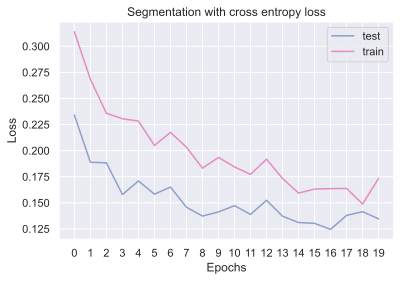

In [ ]:
loss_plt(df, title="Segmentation with cross entropy loss")
df.dtypes

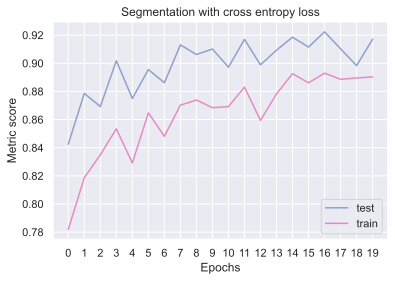

In [ ]:
metric_plt(df, title="Segmentation with cross entropy loss")

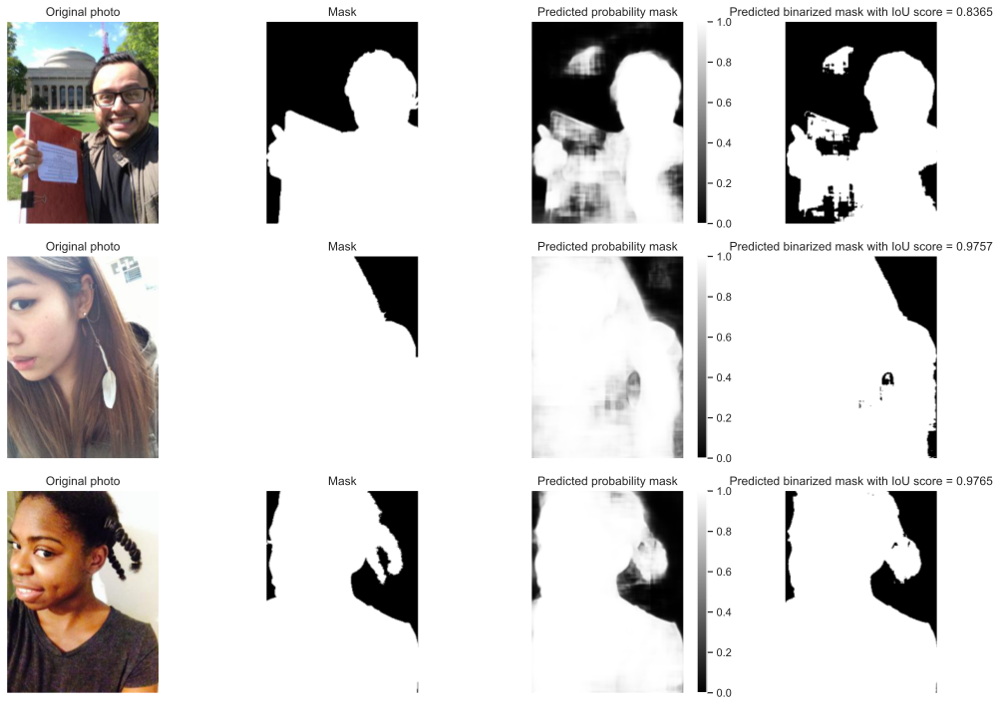

In [ ]:
imgs_plt(imgs['test'], device, model)

In [ ]:
print('mean epoch time(s):', np.mean(df['Time']))

mean epoch time(s): 57.33753989934921


Для обучения:
1. среднее время по эпохе(без учета логирования) = 57.3 секунды
2. наибольшее качество около 0.89
3. наименьший лосс около 0.150

Для теста:
1. наибольшее качество около 0.92
2. наименьший лосс около 0.125
Заметим, что график трейна ниже график теста, это происходит, так как мы нейронке даем более сложные изображения(с разной яркостью и тд)

## Dice loss

In [ ]:
learning_rate = 0.0001
criterion = DiceLoss(reduction='mean')
metric = IoUScore(threshold=0.6, reduction='sum')
model = UNet()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

idxs_test = np.random.choice(len(test_dataset), 3, replace=False)
idxs_train = np.random.choice(len(train_dataset), 3, replace=False)

imgs = dict()
imgs['test'] = [test_dataset[i] for i in idxs_test]
imgs['train'] = [train_dataset[i] for i in idxs_train]

log_dir = "logs/unet/dice" 
writer = SummaryWriter(log_dir)
device

device(type='cuda', index=0)

In [ ]:
%tensorboard --logdir logs

In [ ]:
df = train_epoch(model, n_epochs, train_loader, test_loader, criterion, 
                 optimizer, device, metric, imgs, writer)

  0%|          | 0/20 [00:00<?, ?it/s]

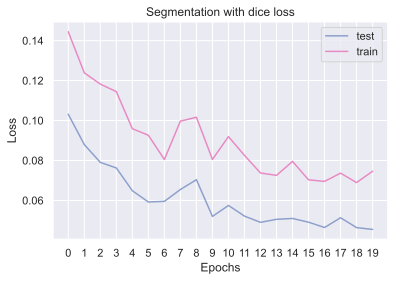

In [ ]:
loss_plt(df, title="Segmentation with dice loss")

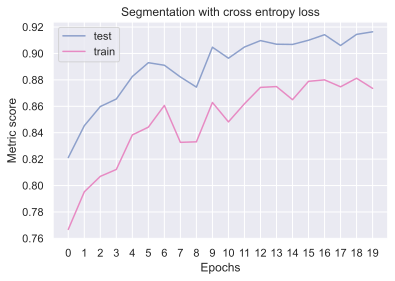

In [ ]:
metric_plt(df, title="Segmentation with dice loss")

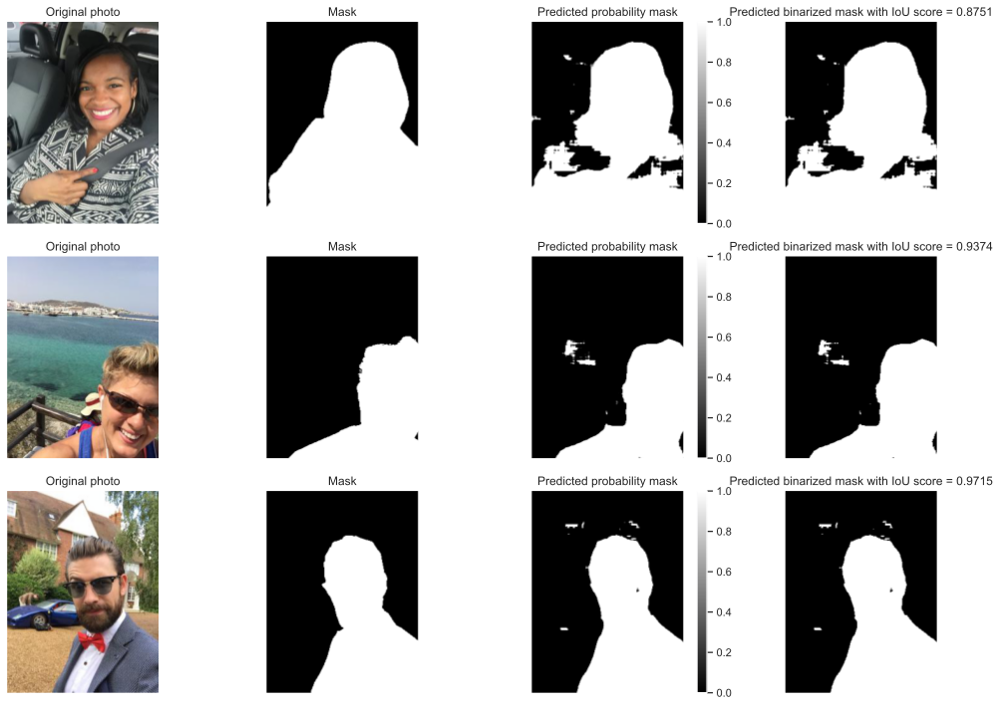

In [ ]:
imgs_plt(imgs['test'], device, model)

In [ ]:
print('mean epoch time(s):', np.mean(df['Time']))

mean epoch time(s): 57.36476907730103


Для обучения:
1. среднее время по эпохе(без учета логирования) = 57.3 секунды
2. наибольшее качество около 0.88
3. наименьший лосс около 0.07

Для теста:
1. наибольшее качество около 0.92
2. наименьший лосс около 0.05

Заметим, что график трейна ниже график теста, это происходит, так как мы нейронке даем более сложные изображения(с разной яркостью и тд)

## Mixture of Dice and CrossEntropy

In [ ]:
class MixDiceCrossEntr(torch.nn.Module):
    def __init__(self, w1, w2, eps=1e-7, reduction=None, with_logits=True):
        super().__init__()
        self.DiceLoss = DiceLoss(reduction='mean')
        self.LogitsLoss = torch.nn.BCEWithLogitsLoss()
        self.w1 = w1
        self.w2 = w2
    def forward(self, logits, true_labels):
        return (self.w1 * self.DiceLoss.forward(logits,true_labels) + 
                self.w2 * self.LogitsLoss.forward(logits,true_labels))

### $\frac{1}{2} DiceLoss + \frac{1}{2} CrossEntropy$

In [ ]:
learning_rate = 0.0001
criterion = MixDiceCrossEntr(1/2, 1/2)
metric = IoUScore(threshold=0.6, reduction='sum')
model = UNet()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

idxs_test = np.random.choice(len(test_dataset), 3, replace=False)
idxs_train = np.random.choice(len(train_dataset), 3, replace=False)

imgs = dict()
imgs['test'] = [test_dataset[i] for i in idxs_test]
imgs['train'] = [train_dataset[i] for i in idxs_train]

log_dir = "logs/unet/0.5Dice0.5CrossEntr" 
writer = SummaryWriter(log_dir)
device

device(type='cuda', index=0)

In [ ]:
df = train_epoch(model, n_epochs, train_loader, test_loader, criterion, 
                 optimizer, device, metric, imgs, writer)

  0%|          | 0/20 [00:00<?, ?it/s]

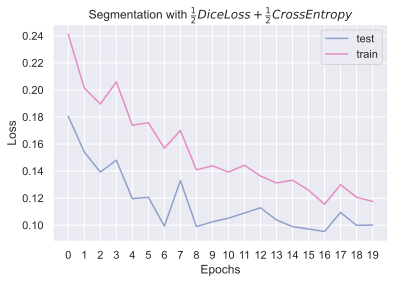

In [ ]:
loss_plt(df, title=r"Segmentation with $\frac{1}{2} DiceLoss + \frac{1}{2} CrossEntropy$")

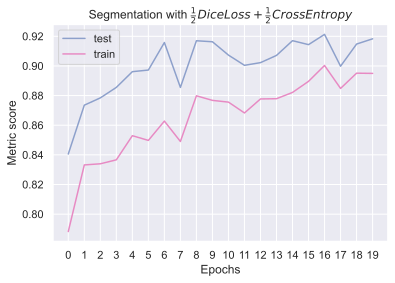

In [ ]:
metric_plt(df, title=r"Segmentation with $\frac{1}{2} DiceLoss + \frac{1}{2} CrossEntropy$")

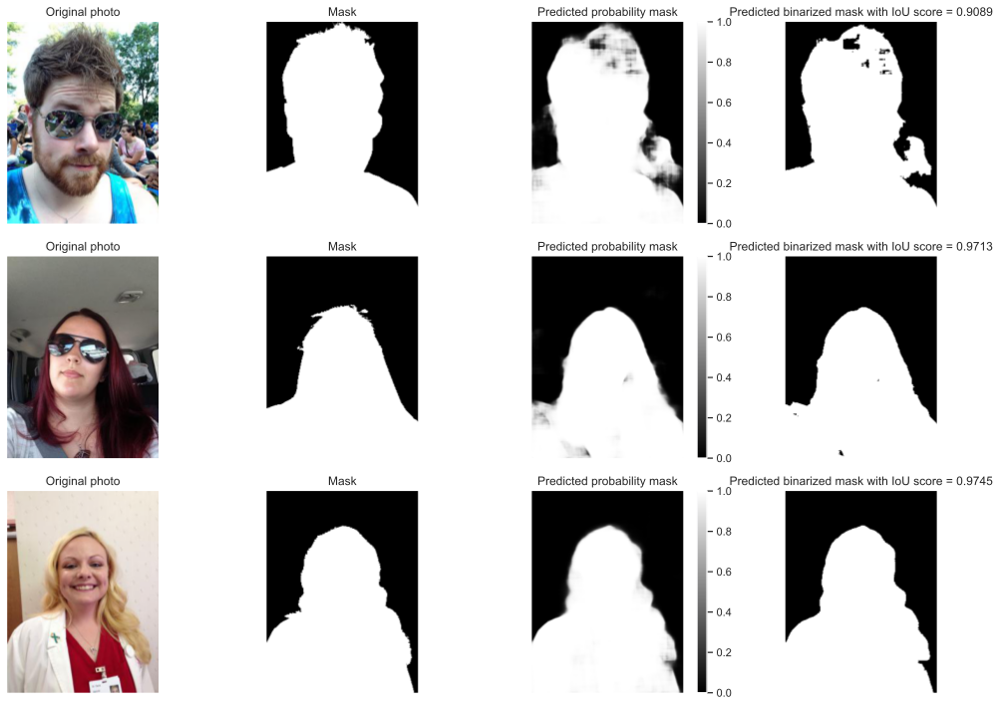

In [ ]:
imgs_plt(imgs['test'], device, model)

In [ ]:
print('mean epoch time(s):', np.mean(df['Time']))

mean epoch time(s): 46.49309157133102


Для обучения:
1. среднее время по эпохе(без учета логирования) = 46.5 секунды
2. наибольшее качество около 0.9
3. наименьший лосс около 0.12

Для теста:
1. наибольшее качество чуть больше 0.92, что лучше чем на предыдущих экспериментах.
2. наименьший лосс около 0.07

По времени получился быстрее чем предыдущие эксперименты

Заметим, что график трейна ниже график теста, это происходит, так как мы нейронке даем более сложные изображения(с разной яркостью и тд)

### $3 DiceLoss +  CrossEntropy$

In [ ]:
learning_rate = 0.0001
criterion = MixDiceCrossEntr(3, 1)
metric = IoUScore(threshold=0.6, reduction='sum')
model = UNet()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

idxs_test = np.random.choice(len(test_dataset), 3, replace=False)
idxs_train = np.random.choice(len(train_dataset), 3, replace=False)

imgs = dict()
imgs['test'] = [test_dataset[i] for i in idxs_test]
imgs['train'] = [train_dataset[i] for i in idxs_train]

log_dir = "logs/unet/3Dice1CrossEntr" 
writer = SummaryWriter(log_dir)
device

device(type='cuda', index=0)

In [ ]:
df = train_epoch(model, n_epochs, train_loader, test_loader, criterion, 
                 optimizer, device, metric, imgs, writer)

  0%|          | 0/20 [00:00<?, ?it/s]

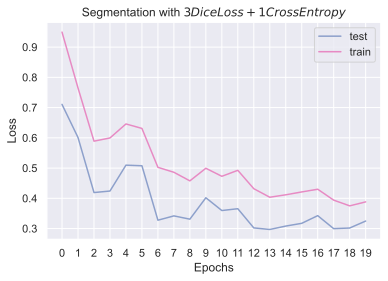

In [ ]:
loss_plt(df, title=r"Segmentation with $3 DiceLoss + 1CrossEntropy$")

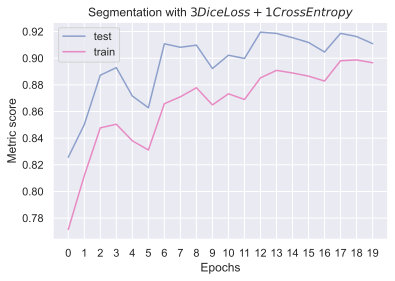

In [ ]:
metric_plt(df, title=r"Segmentation with $3DiceLoss + 1CrossEntropy$")

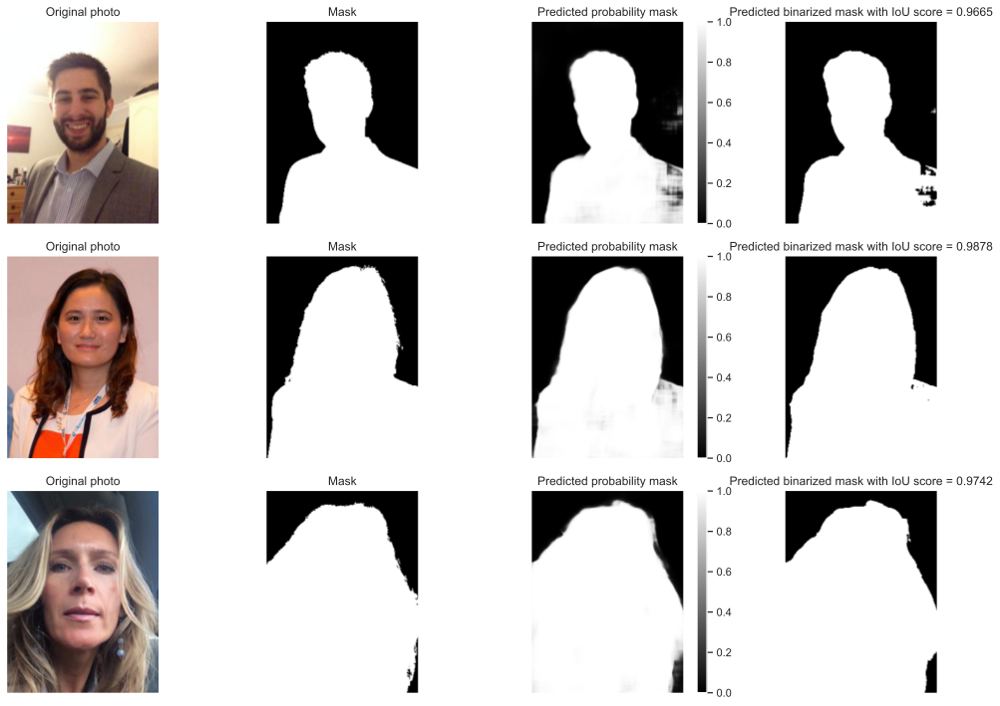

In [ ]:
imgs_plt(imgs['test'], device, model)

In [ ]:
print('mean epoch time(s):', np.mean(df['Time']))

mean epoch time(s): 46.480234467983244


Для обучения:
1. среднее время по эпохе(без учета логирования) = 46.5 секунды
2. наибольшее качество около 0.9
3. наименьший лосс около 0.38

Для теста:
1. наибольшее качество около 0.92
2. наименьший лосс около 0.3

По среднему времени эпохи похож на предыдущи, а по качеству на первые два эксперимента.

Заметим, что график трейна ниже график теста, это происходит, так как мы нейронке даем более сложные изображения(с разной яркостью и тд)

### $ DiceLoss +  3CrossEntropy$

In [ ]:
learning_rate = 0.0001
criterion = MixDiceCrossEntr(1, 3)
metric = IoUScore(threshold=0.6, reduction='sum')
model = UNet()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

idxs_test = np.random.choice(len(test_dataset), 3, replace=False)
idxs_train = np.random.choice(len(train_dataset), 3, replace=False)

imgs = dict()
imgs['test'] = [test_dataset[i] for i in idxs_test]
imgs['train'] = [train_dataset[i] for i in idxs_train]

log_dir = "logs/unet/1Dice3CrossEntr" 
writer = SummaryWriter(log_dir)
device

device(type='cuda', index=0)

In [ ]:
df = train_epoch(model, n_epochs , train_loader, test_loader, criterion, 
                 optimizer, device, metric, imgs, writer)

  0%|          | 0/20 [00:00<?, ?it/s]

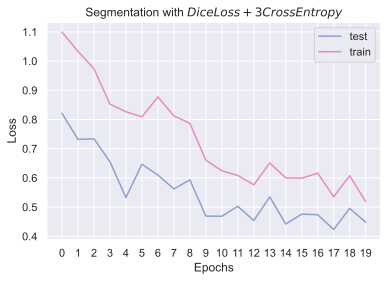

In [ ]:
loss_plt(df, title=r"Segmentation with $ DiceLoss + 3CrossEntropy$")

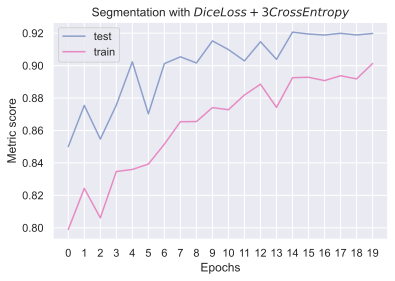

In [ ]:
metric_plt(df, title=r"Segmentation with $DiceLoss + 3CrossEntropy$")

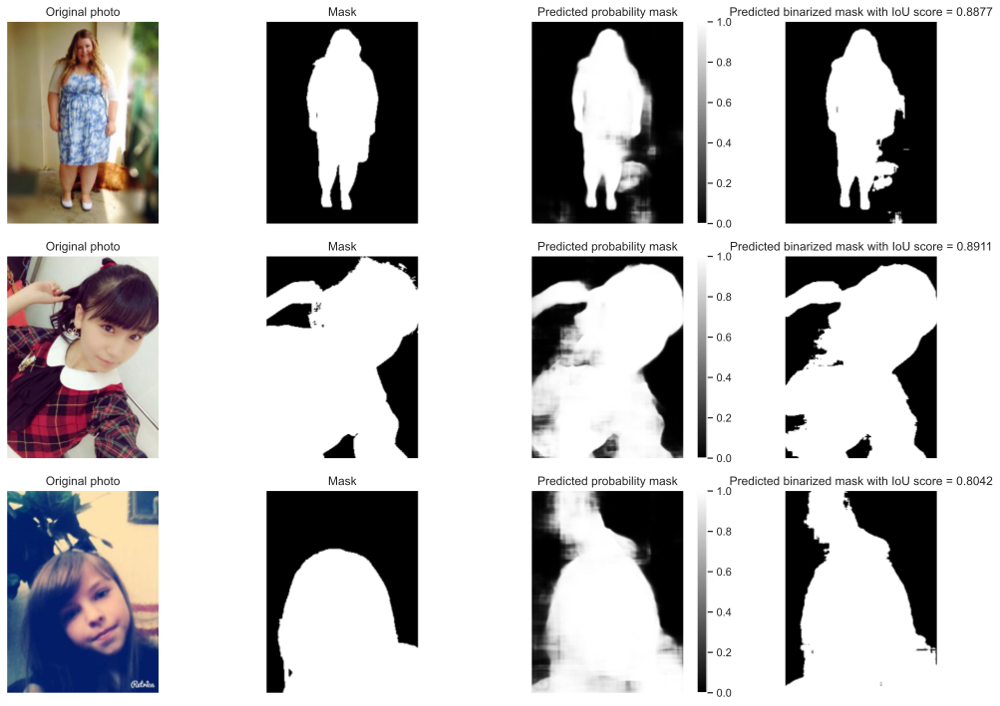

In [ ]:
imgs_plt(imgs['test'], device, model)

In [ ]:
print('mean epoch time(s):', np.mean(df['Time']))

mean epoch time(s): 46.629737210273746


Для обучения:
1. среднее время по эпохе(без учета логирования) = 46.6 секунды
2. наибольшее качество немного выше 0.9
3. наименьший лосс около 0.52

Для теста:
1. наибольшее качество около 0.92
2. наименьший лосс около 0.45

В целом, особо ничем не отличается.

Заметим, что график трейна ниже график теста, это происходит, так как мы нейронке даем более сложные изображения(с разной яркостью и тд)

## `LinkNet (2 балла)`

Реализуйте архитектуру [LinkNet](https://arxiv.org/pdf/1707.03718.pdf) с использованием энкодера, основанного на `VGG13`. Архитектура похожа на `Unet`, но вместо конкатенации слоёв используются skip-connections. Для реализации достаточно переписать структуру декодировщика из предыдущего пункта.

**Обучите сеть и проведите анализ согласно предыдущему пункту. Сравните LinkNet и U-Net по качеству и скорости работы. Сделайте выводы.**

In [ ]:
class DecoderBlockLinkNet(torch.nn.Module):
    def __init__(self, out_channels):
        super().__init__()

        self.upconv = torch.nn.Conv2d(
            in_channels=out_channels * 2, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv1 = torch.nn.Conv2d(
            in_channels=out_channels, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.conv2 = torch.nn.Conv2d(
            in_channels=out_channels, out_channels=out_channels,
            kernel_size=3, padding=1, dilation=1
        )
        self.relu = torch.nn.ReLU()
        
    def forward(self, down, left):
        # Upsample x2 и свёртка
        # your code here
        x = torch.nn.functional.interpolate(down, scale_factor=2)
        x = self.upconv(x)
        
        # skip-connections
        x = left + x
        
        # Две свёртки с ReLu
        # your code here
        x = self.relu(self.conv1(x))
        x = self.relu(self.conv2(x))

        return x

In [ ]:
class DecoderLinkNet(torch.nn.Module):
    def __init__(self, num_filters, num_blocks):
        super().__init__()

        self.blocks = torch.nn.ModuleList()
        for idx in range(num_blocks):
            self.blocks.insert(0, DecoderBlockLinkNet(num_filters * 2 ** idx))

    def forward(self, acts):
        up = acts[-1]
        for block, left in zip(self.blocks, acts[-2::-1]):
            up = block(up, left)
        return up

In [ ]:
class LinkNet(torch.nn.Module):
    def __init__(self, num_classes=1, num_blocks=4):
        super().__init__()
        # your code here
        self.encoder = VGG13Encoder(num_blocks=num_blocks)
        
        # your code here
        self.decoder = DecoderLinkNet(num_filters=64, num_blocks=num_blocks - 1)
        
        # Свёртка 1x1 для попиксельной агрегации каналов
        # your code here
        self.final = torch.nn.Conv2d(
            in_channels=64, out_channels=num_classes, kernel_size=1
        )

    def forward(self, x):
        # your code here
        x = self.encoder(x)
        x = self.decoder(x)
        x = self.final(x)

        return x

## CrossEntropy loss

In [ ]:
learning_rate = 0.0001
criterion = torch.nn.BCEWithLogitsLoss()
metric = IoUScore(threshold=0.6, reduction='sum')
model = LinkNet()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

idxs_test = np.random.choice(len(test_dataset), 3, replace=False)
idxs_train = np.random.choice(len(train_dataset), 3, replace=False)

imgs = dict()
imgs['test'] = [test_dataset[i] for i in idxs_test]
imgs['train'] = [train_dataset[i] for i in idxs_train]

log_dir = "logs/linknet/cross_entropy" 
writer = SummaryWriter(log_dir)
device

device(type='cuda', index=0)

In [ ]:
df = train_epoch(model, n_epochs, train_loader, test_loader, criterion, 
                 optimizer, device, metric, imgs, writer)

  0%|          | 0/20 [00:00<?, ?it/s]

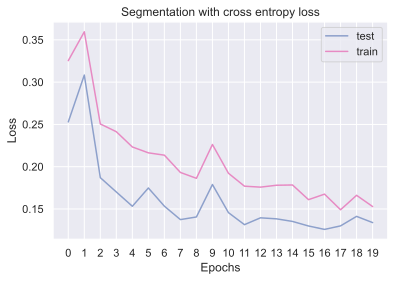

In [ ]:
loss_plt(df, title="Segmentation with cross entropy loss")

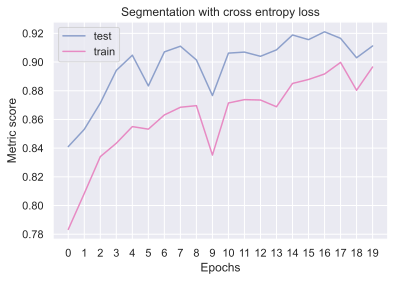

In [ ]:
metric_plt(df, title="Segmentation with cross entropy loss")

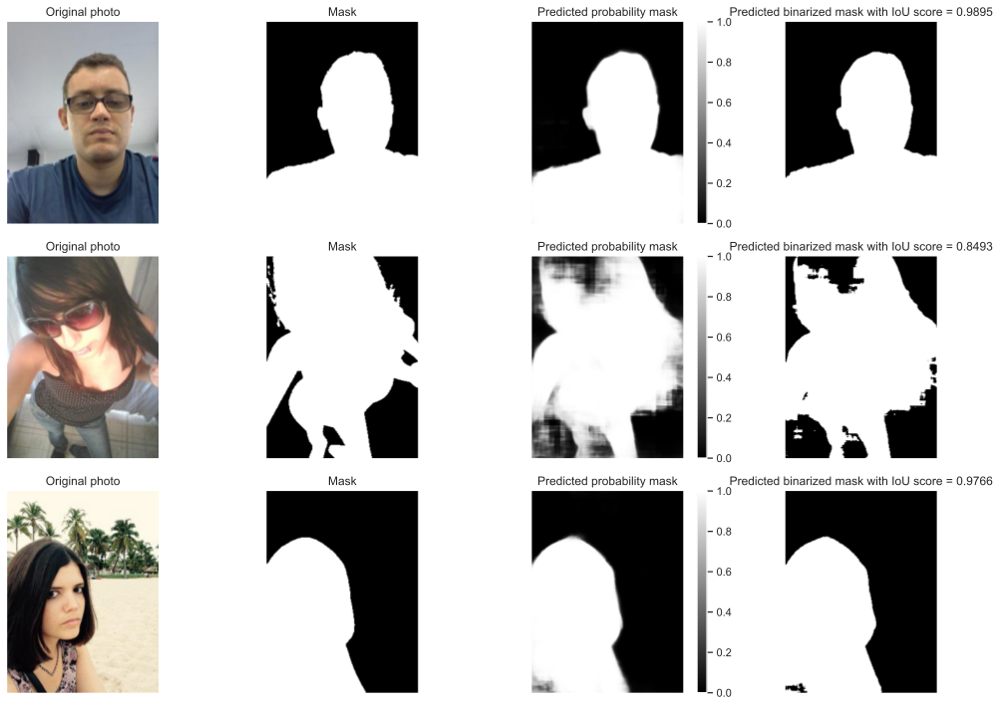

In [ ]:
imgs_plt(imgs['test'], device, model)

In [ ]:
print('mean epoch time(s):', np.mean(df['Time']))

mean epoch time(s): 44.12388961315155


Для обучения:
1. среднее время по эпохе(без учета логирования) = 44.1 секунды
2. наибольшее качество немного выше 0.9
3. наименьший лосс около 0.150

Для теста:
1. наибольшее качество приблизительно 0.92
2. наименьший лосс около 0.125

От UNet с аналошичным лоссом отличается разве что среднем по эпохе временем. Linknet на 10 секунд быстрее

Заметим, что график трейна ниже график теста, это происходит, так как мы нейронке даем более сложные изображения(с разной яркостью и тд)


## Dice loss

In [ ]:
learning_rate = 0.0001
criterion = DiceLoss(reduction='mean')
metric = IoUScore(threshold=0.6, reduction='sum')
model = LinkNet()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

idxs_test = np.random.choice(len(test_dataset), 3, replace=False)
idxs_train = np.random.choice(len(train_dataset), 3, replace=False)

imgs = dict()
imgs['test'] = [test_dataset[i] for i in idxs_test]
imgs['train'] = [train_dataset[i] for i in idxs_train]

log_dir = "logs/linknet/dice" 
writer = SummaryWriter(log_dir)
device
None

In [ ]:
df = train_epoch(model, n_epochs, train_loader, test_loader, criterion, 
                 optimizer, device, metric, imgs, writer)
None

  0%|          | 0/20 [00:00<?, ?it/s]

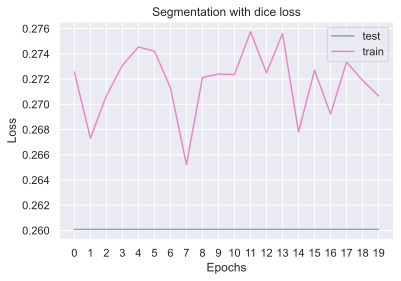

In [ ]:
loss_plt(df, title="Segmentation with dice loss")

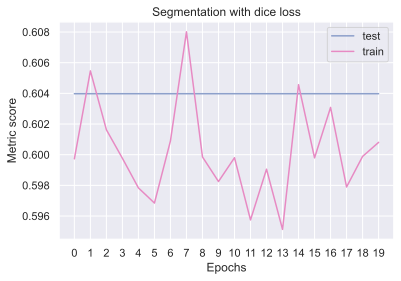

In [ ]:
metric_plt(df, title="Segmentation with dice loss")

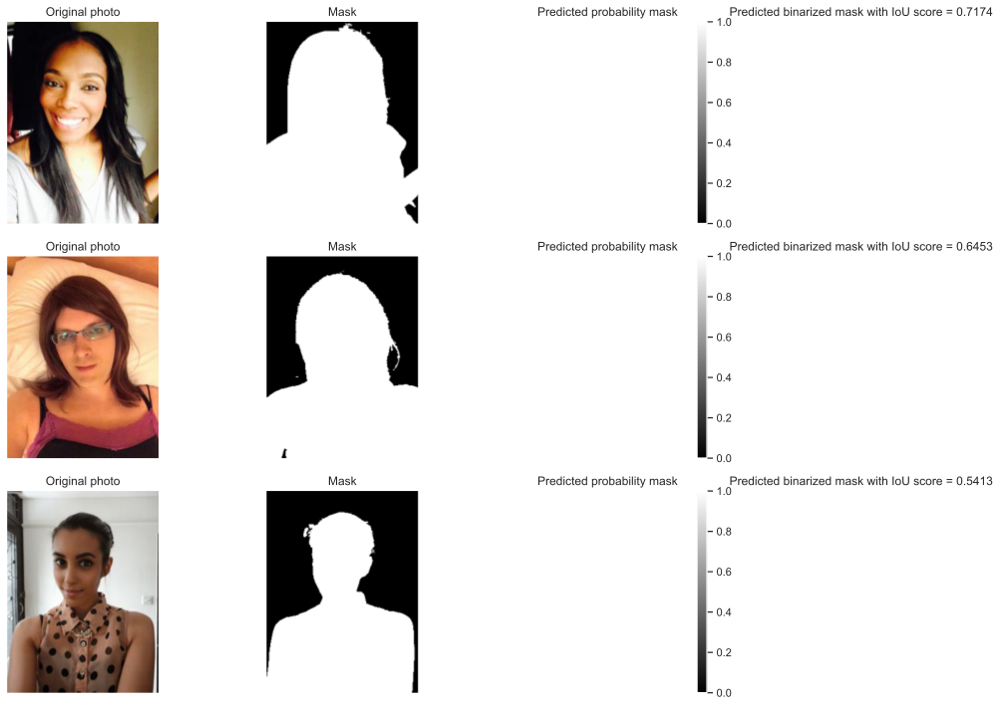

In [ ]:
imgs_plt(imgs['test'], device, model)

In [ ]:
print('mean epoch time(s):', np.mean(df['Time']))

mean epoch time(s): 48.72469598054886


Для обучения:
1. среднее время по эпохе(без учета логирования) = 46.4 секунды
2. наибольшее качество немного выше 0.608
3. наименьший лосс около 0.276

Для теста:
1. наибольшее качество = 0.604 и константа так как задача не сходится
2. наименьший лосс около 0.260

Пока что самый худший из всех рассмотренных вариантов.

Заметим, что график трейна ниже график теста, это происходит, так как мы нейронке даем более сложные изображения(с разной яркостью и тд)

## Mixture of Dice and CrossEntropy

In [ ]:
class MixDiceCrossEntr(torch.nn.Module):
    def __init__(self, w1, w2, eps=1e-7, reduction=None, with_logits=True):
        super().__init__()
        self.DiceLoss = DiceLoss(reduction='mean')
        self.LogitsLoss = torch.nn.BCEWithLogitsLoss()
        self.w1 = w1
        self.w2 = w2
    def forward(self, logits, true_labels):
        return (self.w1 * self.DiceLoss.forward(logits,true_labels) + 
                self.w2 * self.LogitsLoss.forward(logits,true_labels))

### $\frac{1}{2} DiceLoss + \frac{1}{2} CrossEntropy$

In [ ]:
learning_rate = 0.0001
criterion = MixDiceCrossEntr(1/2, 1/2)
metric = IoUScore(threshold=0.6, reduction='sum')
model = LinkNet()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

idxs_test = np.random.choice(len(test_dataset), 3, replace=False)
idxs_train = np.random.choice(len(train_dataset), 3, replace=False)

imgs = dict()
imgs['test'] = [test_dataset[i] for i in idxs_test]
imgs['train'] = [train_dataset[i] for i in idxs_train]

log_dir = "logs/linknet/0.5Dice0.5CrossEntr" 
writer = SummaryWriter(log_dir)
device

device(type='cuda', index=0)

In [ ]:
df = train_epoch(model, n_epochs, train_loader, test_loader, criterion, 
                 optimizer, device, metric, imgs, writer)

  0%|          | 0/20 [00:00<?, ?it/s]

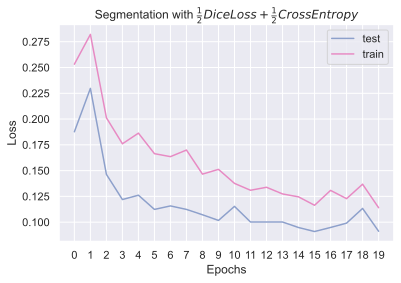

In [ ]:
loss_plt(df, title=r"Segmentation with $\frac{1}{2} DiceLoss + \frac{1}{2} CrossEntropy$")

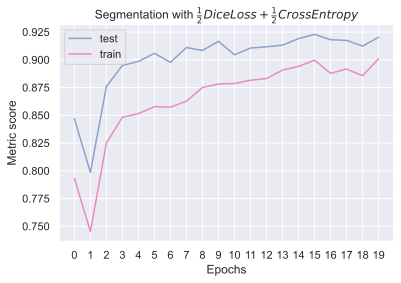

In [ ]:
metric_plt(df, title=r"Segmentation with $\frac{1}{2} DiceLoss + \frac{1}{2} CrossEntropy$")

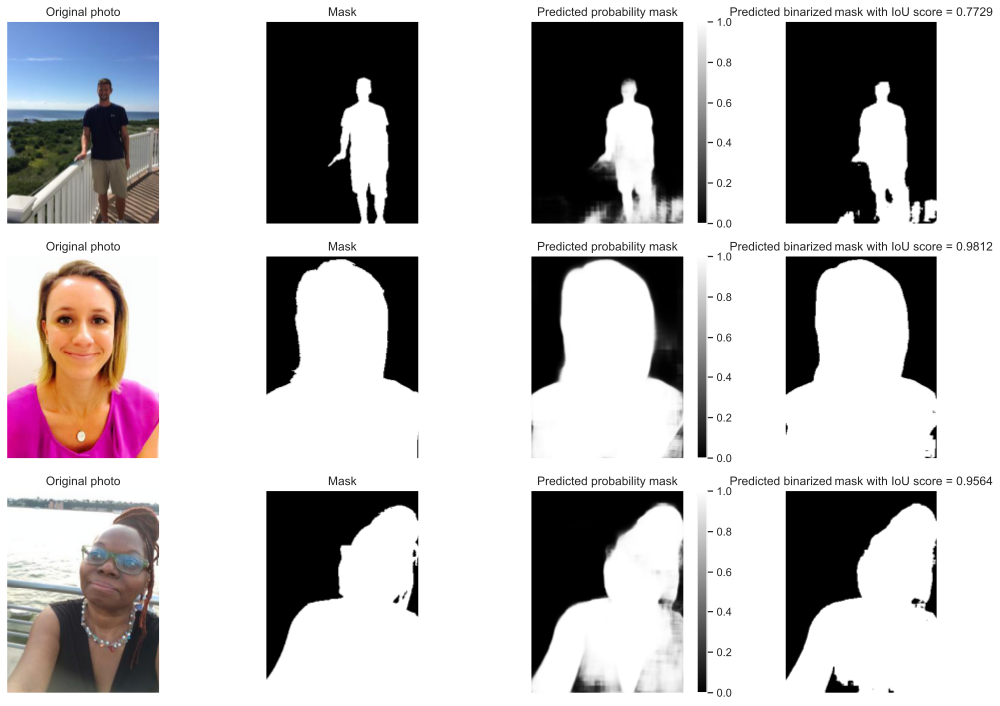

In [ ]:
imgs_plt(imgs['test'], device, model)

In [ ]:
print('mean epoch time(s):', np.mean(df['Time']))

mean epoch time(s): 41.653030169010165


Для обучения:
1. среднее время по эпохе(без учета логирования) = 41.7 секунды
2. наибольшее качество около 0.9
3. наименьший лосс около 0.115

Для теста:
1. наибольшее качество выше 0.925 (новый рекорд среди остальных)
2. наименьший лосс около 0.95

Пока что самый лучший из всех рассмотренных вариантов. Процентов на 10 быстрее чем Unet с тем же лоссом

Заметим, что график трейна ниже график теста, это происходит, так как мы нейронке даем более сложные изображения(с разной яркостью и тд)

### $3 DiceLoss +  CrossEntropy$

In [ ]:
learning_rate = 0.0001
criterion = MixDiceCrossEntr(3, 1)
metric = IoUScore(threshold=0.6, reduction='sum')
model = LinkNet()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

idxs_test = np.random.choice(len(test_dataset), 3, replace=False)
idxs_train = np.random.choice(len(train_dataset), 3, replace=False)

imgs = dict()
imgs['test'] = [test_dataset[i] for i in idxs_test]
imgs['train'] = [train_dataset[i] for i in idxs_train]

log_dir = "logs/linknet/3Dice1CrossEntr" 
writer = SummaryWriter(log_dir)
device

device(type='cuda', index=0)

In [ ]:
df = train_epoch(model, n_epochs, train_loader, test_loader, criterion, 
                 optimizer, device, metric, imgs, writer)

  0%|          | 0/20 [00:00<?, ?it/s]

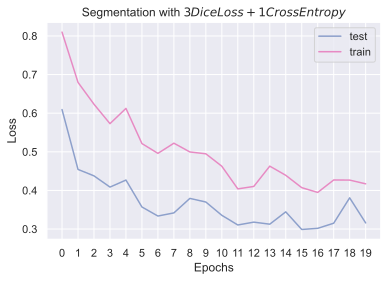

In [ ]:
loss_plt(df, title=r"Segmentation with $3 DiceLoss + 1CrossEntropy$")

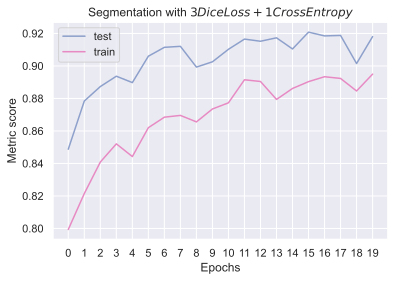

In [ ]:
metric_plt(df, title=r"Segmentation with $3DiceLoss + 1CrossEntropy$")

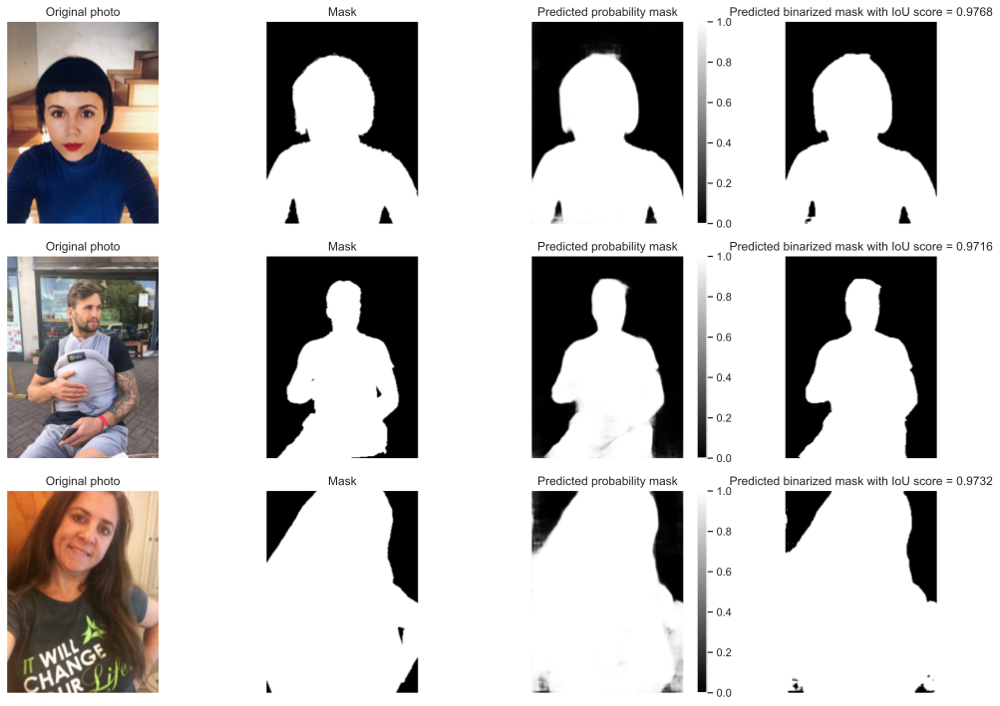

In [ ]:
imgs_plt(imgs['test'], device, model)

In [ ]:
print('mean epoch time(s):', np.mean(df['Time']))

mean epoch time(s): 42.35080134868622


Для обучения:
1. среднее время по эпохе(без учета логирования) = 42.3 секунды
2. наибольшее качество около 0.885
3. наименьший лосс около 0.4

Для теста:
1. наибольшее качество около 0.92
2. наименьший лосс около 0.3

от UNet отличается только временем опять же процентов на 10 быстрее.

Заметим, что график трейна ниже график теста, это происходит, так как мы нейронке даем более сложные изображения(с разной яркостью и тд)

### $ DiceLoss +  3CrossEntropy$

In [ ]:
learning_rate = 0.0001
criterion = MixDiceCrossEntr(1, 3)
metric = IoUScore(threshold=0.6, reduction='sum')
model = LinkNet()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)
device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu') 

idxs_test = np.random.choice(len(test_dataset), 3, replace=False)
idxs_train = np.random.choice(len(train_dataset), 3, replace=False)

imgs = dict()
imgs['test'] = [test_dataset[i] for i in idxs_test]
imgs['train'] = [train_dataset[i] for i in idxs_train]

log_dir = "logs/linknet/1Dice3CrossEntr" 
writer = SummaryWriter(log_dir)
device

device(type='cuda', index=0)

In [ ]:
df = train_epoch(model, n_epochs , train_loader, test_loader, criterion, 
                 optimizer, device, metric, imgs, writer)

  0%|          | 0/20 [00:00<?, ?it/s]

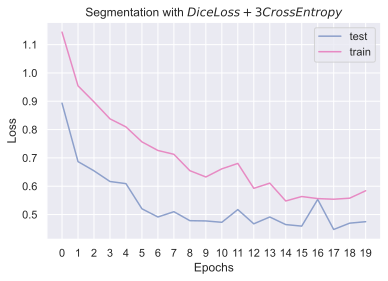

In [ ]:
loss_plt(df, title=r"Segmentation with $ DiceLoss + 3CrossEntropy$")

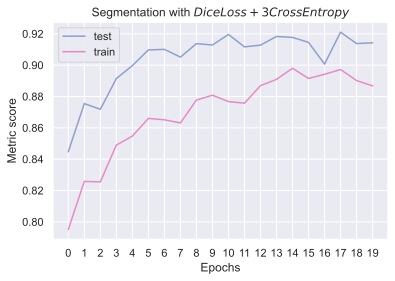

In [ ]:
metric_plt(df, title=r"Segmentation with $DiceLoss + 3CrossEntropy$")

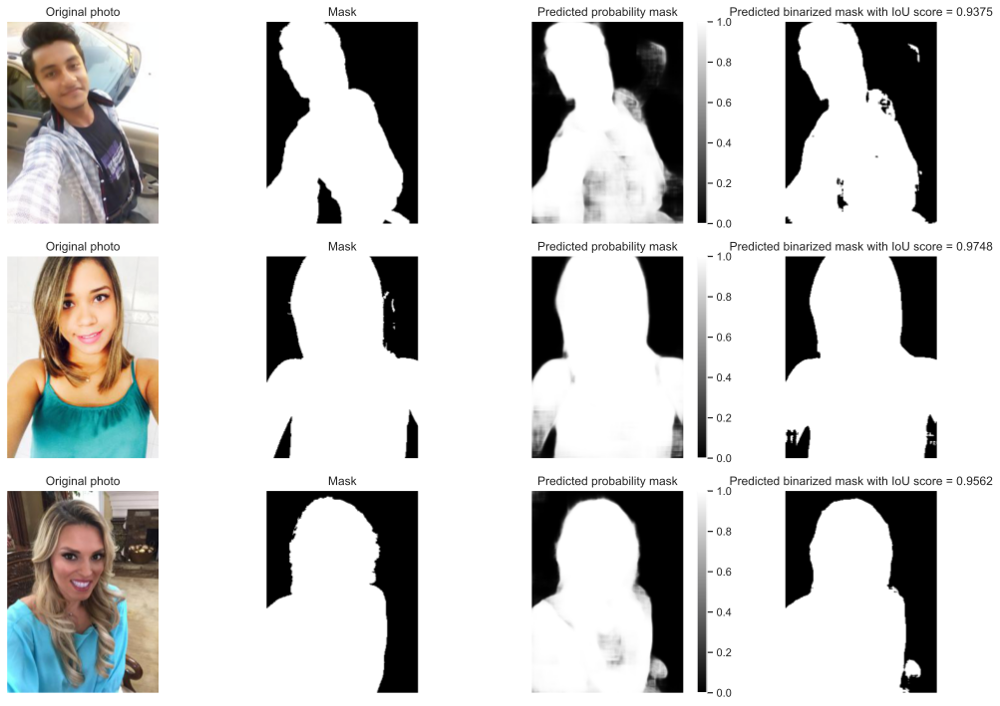

In [ ]:
imgs_plt(imgs['test'], device, model)

In [ ]:
print('mean epoch time(s):', np.mean(df['Time']))

mean epoch time(s): 54.25222117900849


Для обучения:
1. среднее время по эпохе(без учета логирования) = 54.3 секунды
2. наибольшее качество около 0.89
3. наименьший лосс около 0.59

Для теста:
1. наибольшее качество около 0.92
2. наименьший лосс около 0.4

от UNet отличается только временем и в этот раз секунд на 8.

Заметим, что график трейна ниже график теста, это происходит, так как мы нейронке даем более сложные изображения(с разной яркостью и тд)

**Общий вывод** 

В среднем качество то же, что и UNet, но процентов на 8-10 быстрее(кроме последнего случая)

## `Теоретические вопросы (1 балл)`

### `Вопрос 1`
* Сформулируйте два предположения о структуре входных данных, на которые опирается архитектура свёрточных сетей. 
* Какие преимущества дает использование сверток в случае, если эти предположения верные? 
* Приведите пример входных данных, когда эти предположения не выполняются.

*Ваш ответ в этой ячейке*

Архитектура сверточных нейронных сетей опирается на следующие свойства объектов:
1. Стационарность(stationarity), то есть определенные паттерны могут повторяться внутри сигнала -> это позволяет использовать одни и те же веса при проходе фильтра по изображению, так как если точки похожи  -> меньше весов используется -> быстрая сходимость  и меньше памяти на хранение сети
2. Локальность(locality), то есть близкие элементы сигнала сильнее коррелируют друг с другом чем дальние (например, в изображениях, если точка синего цвета, то вероятность того, что рядом лежащая с ней точка тоже синяя выше чем та же самая вероятность для далекой точки)-> свертки позволяют собирать локальную информация.
*Преимущества написаны после стрелок

Может плохо работать в случае, если есть центрированные объект(например, лицо человека) и мы с разных сторон  хотели бы  собирать(обучать) разные особености (особенности строения глаз и особенности прически человека с двух половонок относительно оси, проходящей через нос). Для таких задач лучше работает locally-connected layer, который отличается тем, что  не разделяет параметров.


### `Вопрос 2`
Пусть дано множество 1-D входов ${x^{(i)} \in \mathbb{R}^{100}}$. 

Рассмотрим полносвязный слой ${f(\cdot)}$, заданный как ${f(x^{(i)}) = \sigma(Wx^{(i)})}$, где ${W}$ - матрица весов размерности ${1000\times 100}$ и ${\sigma(\cdot)}$ поэлементая функция активации. 

Рассмотрим также сверточный слой ${g(\cdot)}$ с десятью картами признаков: ${g(x^{(i)}) = \sigma([z_1, z_2,...,z_{10}])}$, где ${z_j = x^{(i)}\ast w_j}$ для некоторого ядра свертки ${w_j}$ с размером 3 и паддингом 1. Для ${f(\cdot)}$ и ${g(\cdot)}$ напишите: 

1. Размерность выходного пространства. 
2. Количество обучаемых параметров. 
3. Число операций при выполнении forward pass (при условии наивной реализации перемножения матриц и вычисления сверток).

*Ваш ответ в этой ячейке*

Для $f$:  
1. Размерность выходного пространства: $1000\times1$
2. Количество обучаемых параметров: $100000$
3. Число операций при выполнении forward pass (при условии наивной реализации перемножения матриц и вычисления сверток): $1000$ операций применения сигмоиды, $100000$ умножений и $99000$ сложений

Для $g$:  
1. Размерность выходного пространства: $100\times10$
2. Количество обучаемых параметров: $30$
3. Число операций при выполнении forward pass (при условии наивной реализации перемножения матриц и вычисления сверток): $1000$ операций применения сигмоиды, $3000$ умножений и $2000$ сложений

## `Бонус: постобработка изображений (1 балл)`

В предложенной задаче на фотографиях необходимо сегментировать только центральное изображения. Артефакты, которые появляются на краях изображения, можно удалять с помощью постобработки (например, с помощью модуля [skimage.morphology](https://scikit-image.org/docs/dev/api/skimage.morphology.html)).

Реализуйте какой-нибудь из методов постобработки, дающий прирост в качестве. Продемонстрируйте несколько изображений, на которых постобработка будет оказывать влияние на результат сегментации.

## `Бонус: существенное улучшение качества (2 балла)`

Придумайте какой-нибудь трюк, который существенно (с учётом бонусного пункта 1) повысит качество (которое должно быть и так достаточно высоко). Не разрешается использовать дополнительные данные или другие предобученные кодировщики кроме VGG13.

Если вы что-то попробовали, но качество не повысилось, всё равно оформите этот пункт, даже за неудачные попытки могут быть начислены баллы.

## `Бонус: обучение с использованием сторонних фреймворков (1 балл)`

Попробуйте обучить свою модель с использованием одного из следующих фреймворков: [catalyst](https://github.com/catalyst-team/catalyst), [pytorch-lightning](https://www.pytorchlightning.ai/), [ignite](https://github.com/pytorch/ignite).

## `Бонус: аугментации (0.5 балла)`

Воспользуйтесь сторонними библиотеками для аугментаций, например, [deepaugment](https://github.com/barisozmen/deepaugment) и [albumentations](https://albumentations.ai/) для улучшения качества модели.

## `Бонус: torch.compile (0.25 балла)`

Попробуйте установить [Pytorch 2.0](https://pytorch.org/get-started/pytorch-2.0/) и запустите обучение с использованием `torch.compile`. Тщательно сравните время с и без использованием компиляции.

*Замечание:* обязательно укажите конфигурацию системы (версия OS, модель CPU/GPU, объём RAM), на которой производилось обучение. В частности, приложите вывод команд:
```bash
! nvcc --version
! nvidia-smi
```